# ECG Image Dataset 
Here I load and read the data, then label each folder with its respective name:


*   **MI**
*   **HMI**
*   **AbnHB**
*   **Normal**


Moreover, I create a function to Crope the ECG Report and leave just the ECG Signal.

Then I extract the 12leads from the ECG Signal.


#### Ayoub Berdeddouch

# Loading Libraries

In [ ]:
!pip install visualkeras

In [1]:
import pandas as pd                                     # Data analysis and manipultion tool
import numpy as np                                      # Fundamental package for linear algebra and multidimensional arrays
import tensorflow as tf                                 # Deep Learning Tool
import os
import os.path
from pathlib import Path
import cv2                                              # Library for image processing
from sklearn.model_selection import train_test_split    # For splitting the data into train and validation set
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras import datasets, layers, models, losses, Model, optimizers
from sklearn.utils import shuffle
from tensorflow.keras.initializers import RandomUniform
import datetime as dt
from PIL import Image

import glob
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, GlobalAveragePooling2D, SpatialDropout2D
from tensorflow.keras import layers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.utils import plot_model
from sklearn.metrics import confusion_matrix, classification_report, recall_score, precision_score, f1_score, roc_auc_score, roc_curve
from tensorflow.keras.preprocessing import image
from PIL import Image
#import visualkeras

# Loading Data 

## First Method

In [2]:
!wget "https://md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com/gwbz3fsgp8-2.zip"

--2021-08-04 21:15:53--  https://md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com/gwbz3fsgp8-2.zip
Resolving md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com (md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com)... 52.218.118.10
Connecting to md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com (md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com)|52.218.118.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 203349349 (194M) [application/octet-stream]
Saving to: ‘gwbz3fsgp8-2.zip’

gwbz3fsgp8-2.zip    100%[===================>] 193.93M  32.7MB/s    in 6.6s    

2021-08-04 21:16:00 (29.5 MB/s) - ‘gwbz3fsgp8-2.zip’ saved [203349349/203349349]



In [ ]:
!unzip gwbz3fsgp8-2.zip
# done

## Loading & Reading Images of **MI** (=Myocardial Infarction) Patiens

In [4]:
# MI patients data
ECG_MI_dir_ = Path('/content/ECG Images of Myocardial Infarction Patients (240x12=2880)')

ECG_MI_filepaths = list(ECG_MI_dir_.glob(r'**/*.jpg'))
# Mapping the labels
MI_labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], ECG_MI_filepaths))
# Paths & labels femalee eyes
ECG_MI_filepaths = pd.Series(ECG_MI_filepaths, name = 'File').astype(str)
MI_labels = pd.Series(MI_labels, name='Label')

# Concatenating...
MI_df = pd.concat([ECG_MI_filepaths, MI_labels], axis=1)
MI_df['Label'] = "MI"

Text(0.5, 1.0, 'MI')

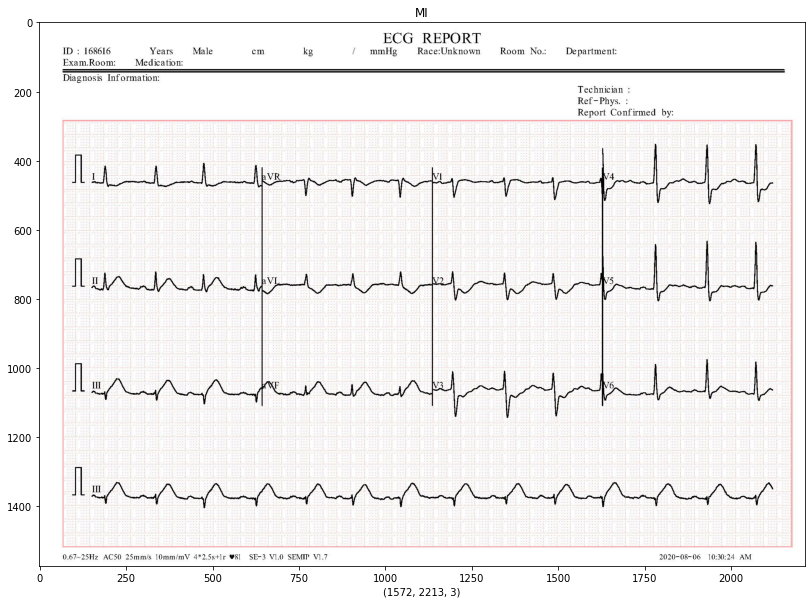

In [5]:
# Image Example of MI
figure = plt.figure(figsize=(20,10))
x = plt.imread(MI_df["File"][0])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(MI_df["Label"][10])

## Loading & Reading Images of **HMI** (= History of Myocardial Infarction) Patiens

In [ ]:
# HMI patients data
ECG_HMI_dir_ = Path('/content/ECG Images of Patient that have History of MI (172x12=2064)')

ECG_HMI_filepaths = list(ECG_HMI_dir_.glob(r'**/*.jpg'))
# Mapping the labels
HMI_labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], ECG_HMI_filepaths))
# Paths & labels femalee eyes
ECG_HMI_filepaths = pd.Series(ECG_HMI_filepaths, name = 'File').astype(str)
HMI_labels = pd.Series(HMI_labels, name='Label')

# Concatenating...
HMI_df = pd.concat([ECG_HMI_filepaths, HMI_labels], axis=1)
HMI_df['Label'] = "HMI"

In [ ]:
# Image Example of MI
figure = plt.figure(figsize=(20,10))
x = plt.imread(HMI_df["File"][0])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(HMI_df["Label"][10])

## Loading & Reading Images of **AbnHB** (= Abnormal Heartbeat) Patiens

In [ ]:
# AbnHB patients data
ECG_AbnHB_dir_ = Path('/content/ECG Images of Patient that have abnormal heartbeat (233x12=2796)')

ECG_AbnHB_filepaths = list(ECG_HMI_dir_.glob(r'**/*.jpg'))
# Mapping the labels
AbnHB_labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], ECG_AbnHB_filepaths))
# Paths & labels femalee eyes
ECG_AbnHB_filepaths = pd.Series(ECG_AbnHB_filepaths, name = 'File').astype(str)
AbnHB_labels = pd.Series(AbnHB_labels, name='Label')

# Concatenating...
AbnHB_df = pd.concat([ECG_AbnHB_filepaths, AbnHB_labels], axis=1)
AbnHB_df['Label'] = "ABNORMAL"

In [ ]:
# Image Example of MI
figure = plt.figure(figsize=(20,10))
x = plt.imread(AbnHB_df["File"][0])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(AbnHB_df["Label"][10])

## Loading & Reading Images of **NORMAL** (= NORMAL Heartbeat) Patiens

In [ ]:
# Normal patients data
ECG_Normal_dir_ = Path('/content/Normal Person ECG Images (284x12=3408)')

ECG_Normal_filepaths = list(ECG_Normal_dir_.glob(r'**/*.jpg'))
# Mapping the labels
Normal_labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], ECG_Normal_filepaths))
# Paths & labels femalee eyes
ECG_Normal_filepaths = pd.Series(ECG_Normal_filepaths, name = 'File').astype(str)
Normal_labels = pd.Series(Normal_labels, name='Label')

# Concatenating...
Normal_df = pd.concat([ECG_Normal_filepaths, Normal_labels], axis=1)
Normal_df['Label'] = "NORMAL"

In [ ]:
# Image Example of MI
figure = plt.figure(figsize=(20,10))
x = plt.imread(Normal_df["File"][0])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Normal_df["Label"][10])

### Then We concatenate our Dataframes.

In [ ]:
# concat
df_ECG = pd.concat([MI_df, HMI_df, AbnHB_df,Normal_df],ignore_index=True)

## Cropping the ECG images
**img_crop** function below:

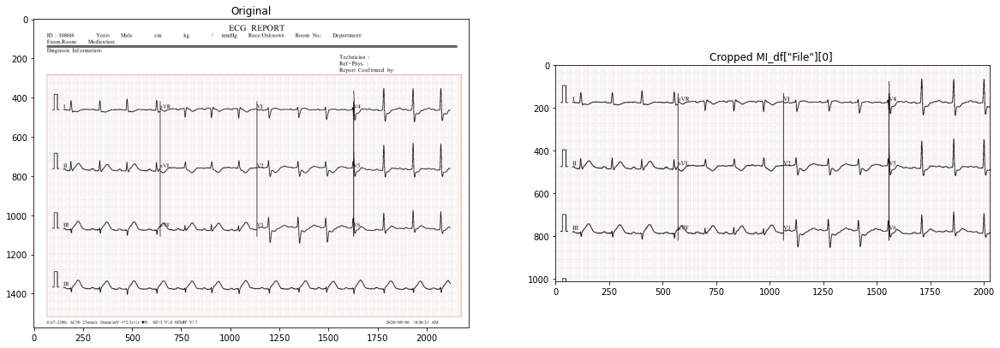

In [109]:
#from PIL import Image
#import matplotlib.pyplot as plt

def im_crop(image,left=71.5, top= 287.5, right=2102, bottom= 1228):
  """ This function is used to crop the image and get just the ECG signals.
      input: 
        image : the image (jpg,png,...Etc)
        left: location in left of image
        top: location in top of image
        right: location in right of image
        bottom: location in bottom of image

        ######
        # choices from paper: left=71.5, top= 287.5, right=2102, bottom= 1228
        ######
      output: 
        img_out: the cropped image.
  """
  img = Image.open(image) # for example : MI_df["File"][0]
  img_out = img.crop((left, top, right, bottom))
  plt.figure(figsize=(20,10))
  plt.subplot(121)
  plt.imshow(img)
  plt.title("Original")

  plt.subplot(122)
  plt.imshow(im1)
  plt.title("Cropped MI_df[\"File\"][0] ")
  plt.show()

  return img_out


# Test 
img_cc = im_crop(MI_df["File"][0])

## Now below to Crop the 12 leads from the ECG Signal Image Cropped

In [104]:
#from PIL import Image
#import matplotlib.pyplot as plt

def im_crop_12leads(image, x, y,title, width= 315, height= 315):
  """ This function is used to crop the image and get 12 leads of  the ECG signals.
      input: 
        image : the image cropped of ECG Signal
        left: location in left of image
        top: location in top of image
        right: location in right of image
        bottom: location in bottom of image

        ######
        # choices from paper: left=71.5, top= 287.5, right=2102, bottom= 1228
        ######
      output: 
        img_out: the cropped image.
  """
  img_out = image.crop((x, y, width + x , y+ height)).convert('L') # Converting Images to Grayscale
  print(type(img_out))

  plt.figure(figsize=(20,10))
  plt.subplot(121)
  plt.imshow(image)
  plt.title("Original")

  plt.subplot(122)
  plt.imshow(img_out)
  plt.title(title)
  plt.show()

  return img_out


<class 'PIL.Image.Image'>


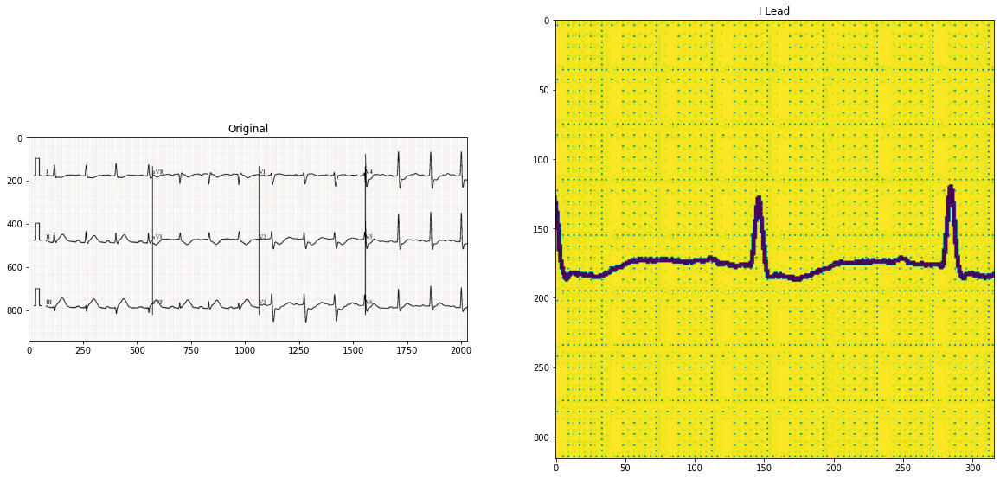

In [110]:
I_img = im_crop_12leads(img_cc,120.5,0.5,"I Lead")

<class 'PIL.Image.Image'>


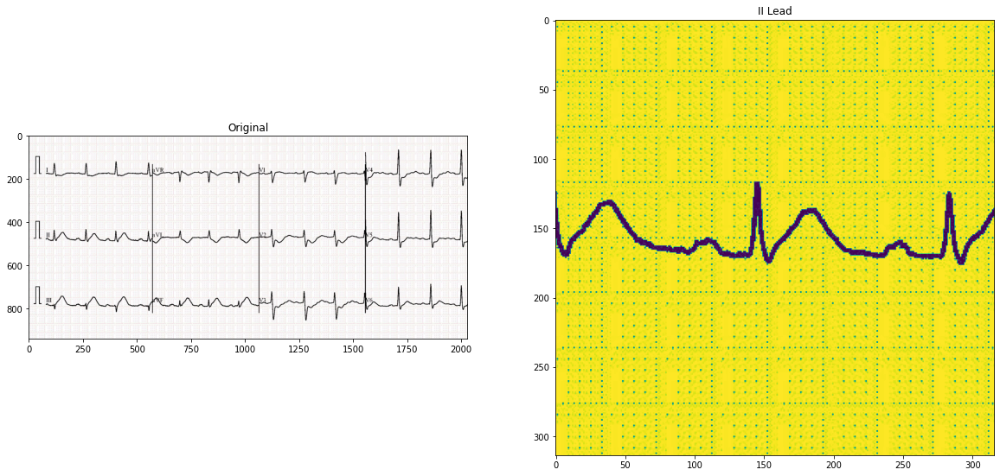

In [111]:
II_img  = im_crop_12leads(img_cc,120.5,315.5,'II Lead') 

<class 'PIL.Image.Image'>


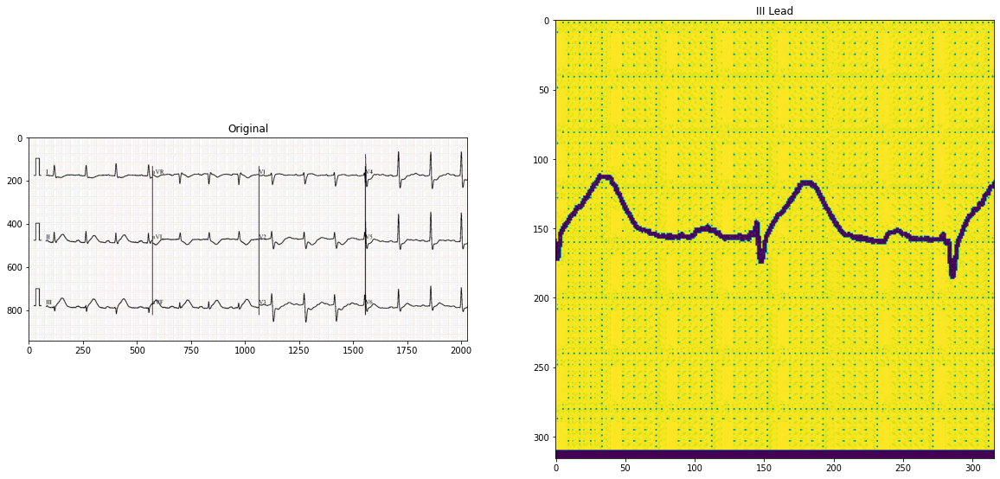

In [112]:
III_img = im_crop_12leads(img_cc,120.5,630.5,'III Lead');

<class 'PIL.Image.Image'>


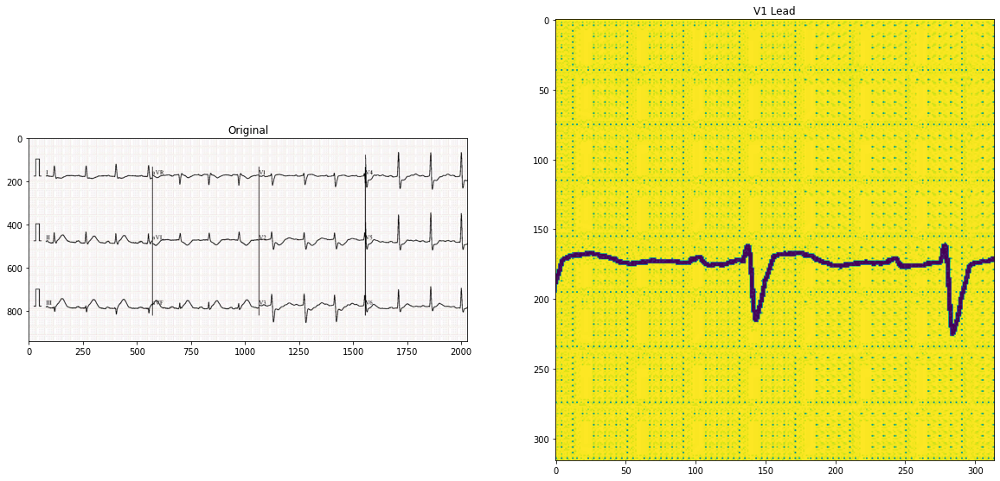

In [113]:
V1_img = im_crop_12leads(img_cc,1133.5,0.5,'V1 Lead')

<class 'PIL.Image.Image'>


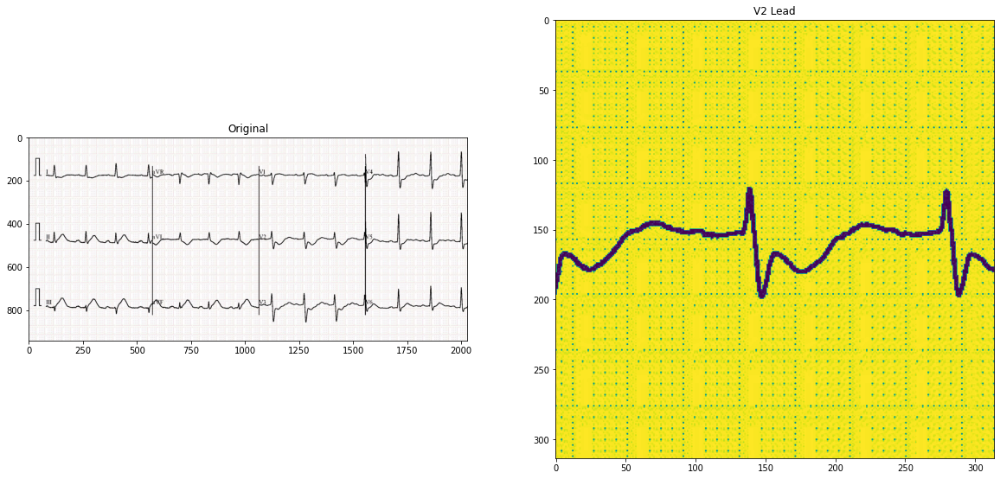

In [114]:
V2_img = im_crop_12leads(img_cc,1133.5,315.5,'V2 Lead');

<class 'PIL.Image.Image'>


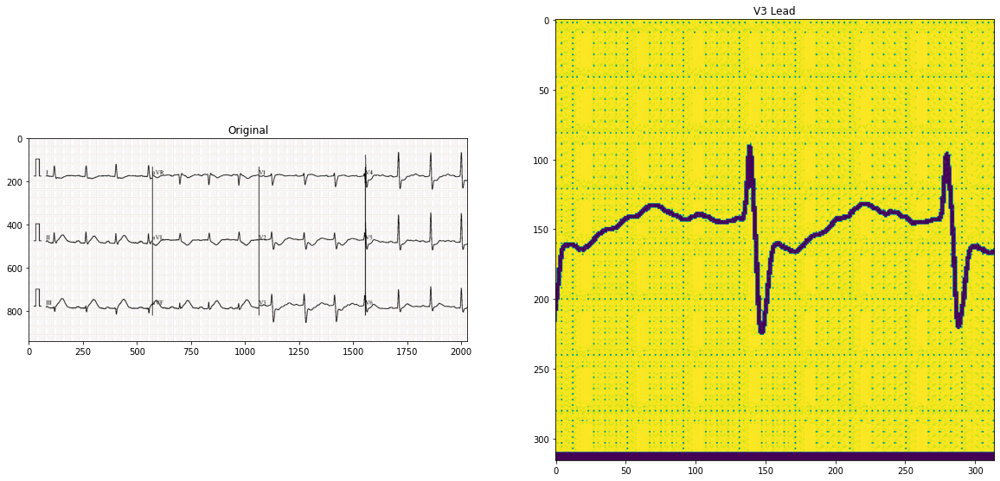

In [115]:
V3_img  = im_crop_12leads(img_cc,1133.5,630.5,'V3 Lead');

<class 'PIL.Image.Image'>


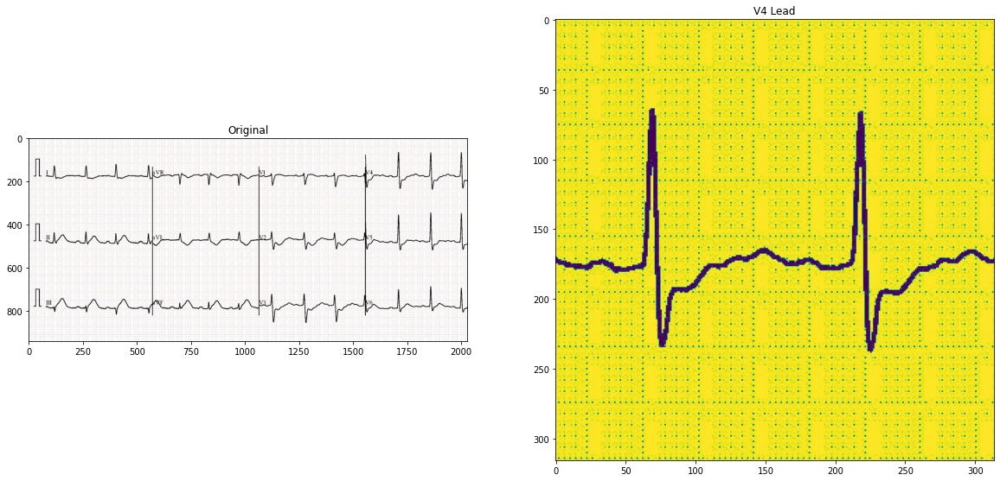

In [116]:
V4_img = im_crop_12leads(img_cc,1639.5,0.5,'V4 Lead')

<class 'PIL.Image.Image'>


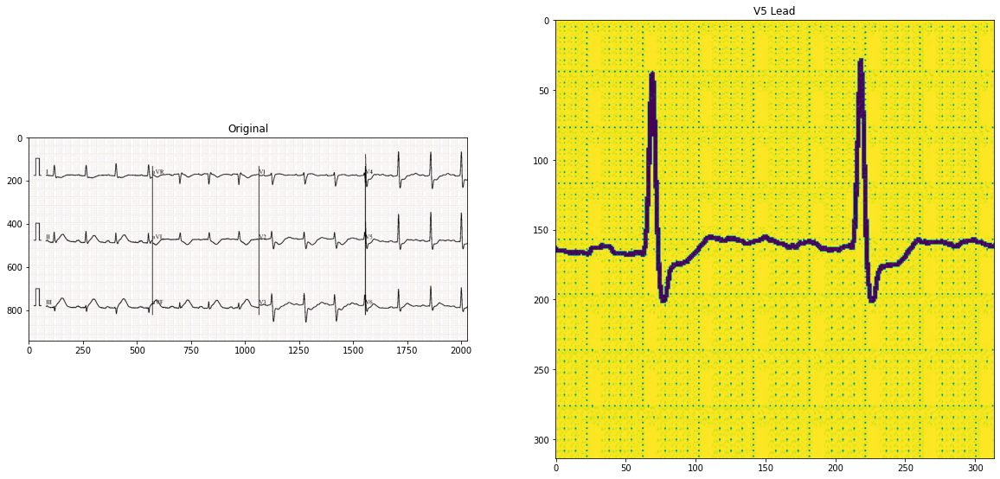

In [117]:
V5_img = im_crop_12leads(img_cc,1639.5,315.5,'V5 Lead');

<class 'PIL.Image.Image'>


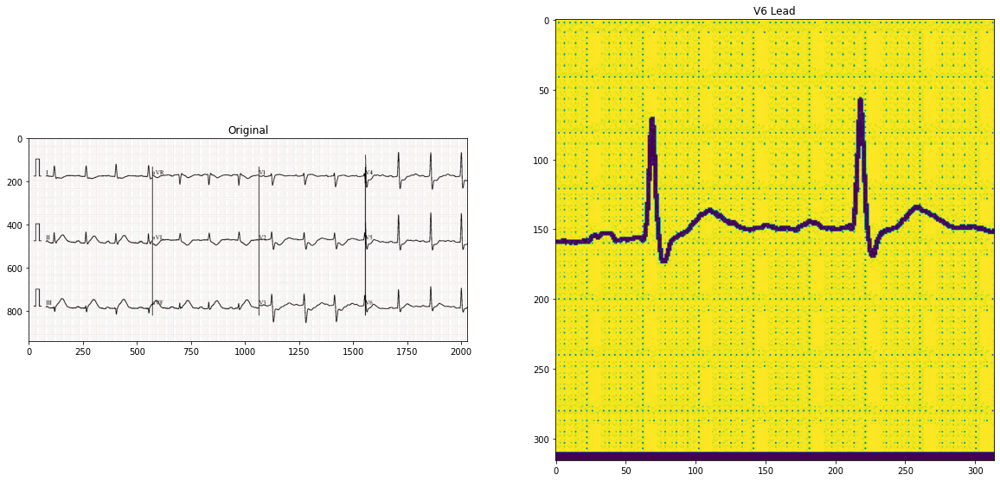

In [118]:
V6_img  = im_crop_12leads(img_cc,1639.5,630.5,'V6 Lead');

<class 'PIL.Image.Image'>


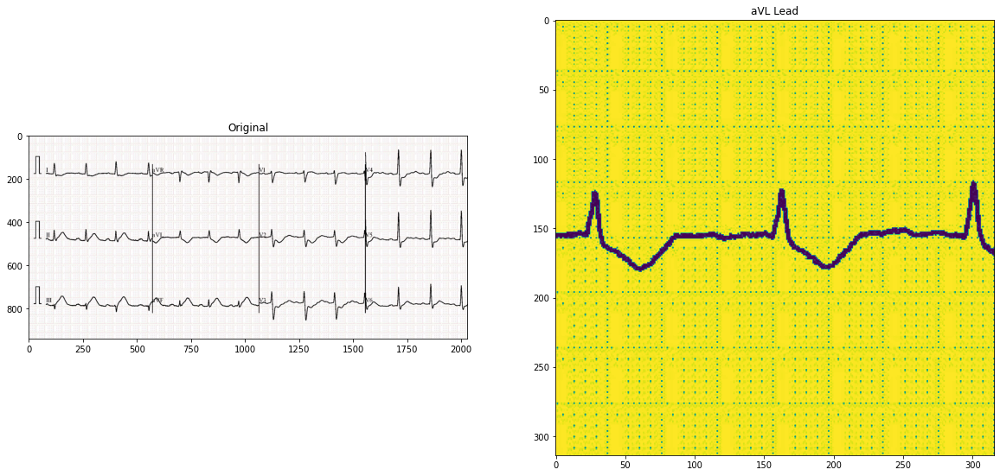

In [119]:
aVL_img = im_crop_12leads(img_cc,672.5,315.5,'aVL Lead')

<class 'PIL.Image.Image'>


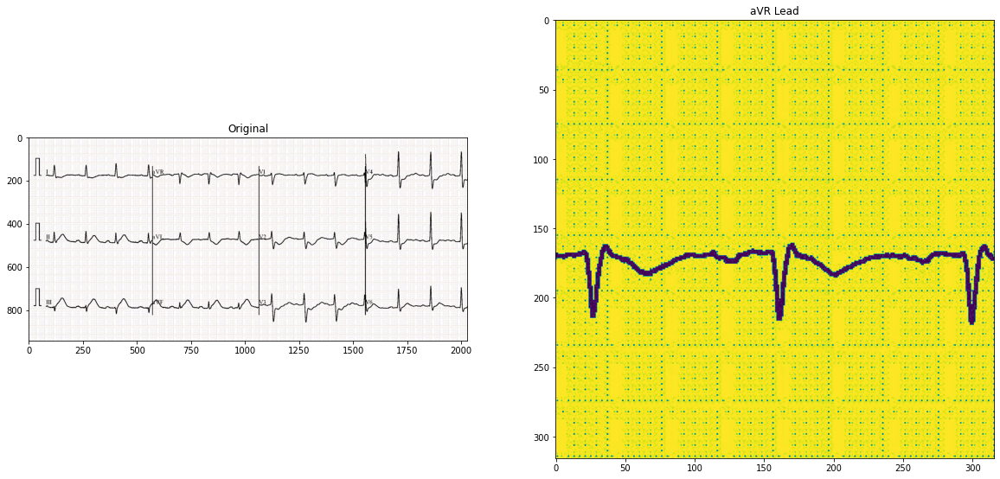

In [120]:
aVR_img = im_crop_12leads(img_cc,672.5,0.5,'aVR Lead')

<class 'PIL.Image.Image'>


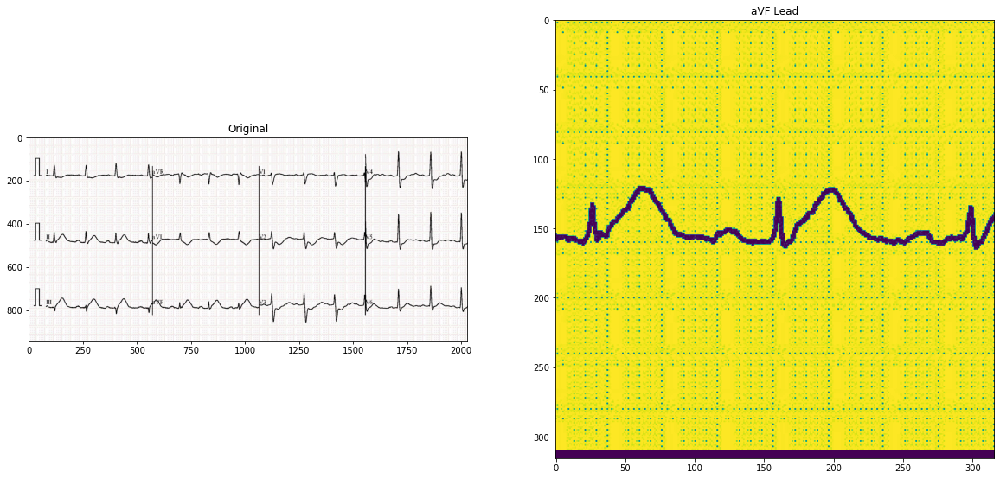

In [121]:
aVF_img = im_crop_12leads(img_cc,672.5,630.5,'aVF Lead');

## Below the Function to get All the 12 Leads at once.

In [ ]:
#from PIL import Image
#import matplotlib.pyplot as plt

def im_crop_12leads(image, width= 315, height= 315):
  """ This function is used to crop the image and get 12 leads of  the ECG signals.
      input: 
        image : the image cropped of ECG Signal
        width = 315
        height = 315

        ######
        # choices from paper: left=71.5, top= 287.5, right=2102, bottom= 1228
        ######
      output: 
        12 img_out: 12 leads ECG
  """

  
  I_img   = image.crop((120.5, 0.5, width + 120.5 , 0.5 + height)).convert('L') # Converting Images to Grayscale 
  aVR_img = image.crop((672.5, 0.5, width + 672.5 , 0.5 + height)).convert('L')
  V1_img  = image.crop(((1133.5, 0.5, width + (1133.5 , 0.5+ height)).convert('L')
  V4_img  = image.crop((1639.5, 0.5, width + 1639.5 , 0.5 + height)).convert('L')
  II_img  = image.crop((120.5, 315.5, width + 120.5 , 315.5+ height)).convert('L')
  aVL_img = image.crop((672.5, 315.5, width + 672.5 , 315.5+ height)).convert('L')
  V2_img  = image.crop((1133.5, 315.5, width + 1133.5 , 315.5+ height)).convert('L')
  V5_img  = image.crop((1639.5, 0.5, width + 1639.5 , 0.5+ height)).convert('L')
  III_img = image.crop((120.5, 630.5, width + 120.5 , 630.5+ height)).convert('L')
  aVF_img = image.crop((672.5, 630.5, width + 672.5 , 630.5+ height)).convert('L')
  V3_img  = image.crop((1133.5, 630.5, width + 1133.5 , 630.5+ height)).convert('L')
  V6_img  = image.crop((1639.5, 630.5, width + 1639.5 , 630.5+ height)).convert('L')
    
    
  plt.figure(figsize=(20,10))
  plt.subplot(411)
  plt.imshow(image)
  plt.title("Original")

  plt.subplot(412)
  plt.imshow(I_img)
  plt.title("I Lead")
  
  plt.subplot(413)
  plt.imshow(II_img)
  plt.title("II Lead")

  plt.subplot(414)
  plt.imshow(III_img)
  plt.title("III Lead")

  plt.subplot(421)
  plt.imshow(V1_img)
  plt.title("V1 Lead")

  plt.subplot(422)
  plt.imshow(V2_img)
  plt.title("V2 Lead")

  plt.subplot(423)
  plt.imshow(V3_img)
  plt.title("V3 Lead")

  plt.subplot(424)
  plt.imshow(V4_img)
  plt.title("V4 Lead")

  plt.subplot(431)
  plt.imshow(V5_img)
  plt.title("V5 Lead")

  plt.subplot(432)
  plt.imshow(V6_img)
  plt.title("V6 Lead")

  plt.subplot(433)
  plt.imshow(aVR_img)
  plt.title("aVR Lead")

  plt.subplot(434)
  plt.imshow(aVL_img)
  plt.title("aVL Lead")

  plt.subplot(441)
  plt.imshow(aVF_img)
  plt.title("aVF Lead")

  plt.show()

  return I_img,II_img,III_img,V1_img,V2_img,V3_img,V4_img,V5_img,V6_img, aVR_img,aVL_img, aVF_img
